# Introduction

This notebook will demonstrate a few different approaches to stain normalization, with the idea that this will cut down on the amount of augmentation we'll need to do cross-site training.

## Prerequisites

This notebook will draw heavily from the "Data Wrangling" hands-on demonstration given by Andrew Janowyzck in the 2020 PathLAKE Masterclass. I will replicate the important points of that discussion here.

A lot of the hits for "stain normalization in Python" point to the [StainTools](https://github.com/Peter554/StainTools) package by Peter Byfield. This package takes inspiration from that tool, but we felt it necessary to create our own because:

- It requires the `spams` package, which is tricky to install on Windows. Possibly there are alternatives?
- The code repository has been archived as of May 2021 -- I'm not sure why, but that doesn't bode well for continuing development. 

Another implementation of stain normalization comes in the form of the [TIA Lab Stain Normalization Toolbox](https://warwick.ac.uk/fac/cross_fac/tia/software/sntoolbox/) from Nasir Rajpoot's group -- this toolbox is written in MATLAB, but surely we'll be able to port it to Python...?

Finally, this article on TDS has some useful information: [https://towardsdatascience.com/stain-estimation-on-microscopy-whole-slide-images-2b5a57062268](https://towardsdatascience.com/stain-estimation-on-microscopy-whole-slide-images-2b5a57062268)

In [1]:
import os
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

from sunycell import stains
from sunycell import datasets
from sunycell import viz

In [2]:
# Grab the sample data
target_image, source_image = datasets.stainnorm_img_pair()

In [3]:
# Convert sample data to numpy arrays
target_image = np.array(target_image)
source_image = np.array(source_image)

In [4]:
# Set up an ROI for looking at close-up image patches
top = 1000
left = 1000
height = 500
width = 500

# RGB Histogram Matching

The idea behind this method is that we're going to adjust the histogram of the source image to be more like the target image. Check the source code for implementation details.

In [5]:
source_rgb = stains.histogram_matching(source_image, target_image)

## Visualization

In [6]:
image_stack = np.stack([source_image, target_image, source_rgb], axis=-1)

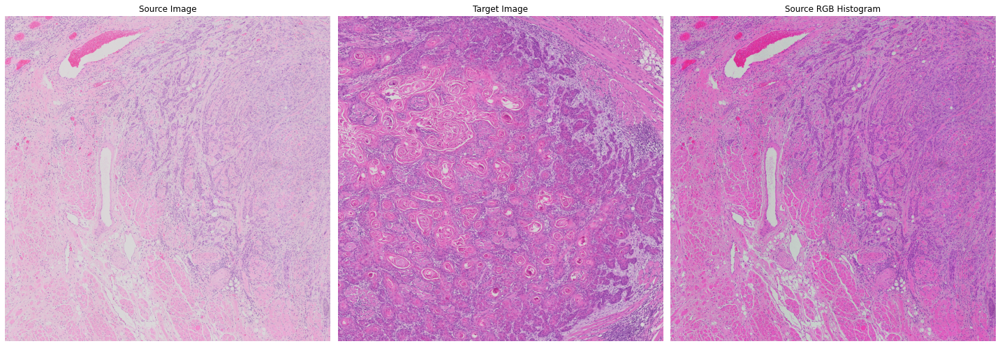

In [7]:
viz.plot_image_stack(image_stack, titles=['Source Image', 'Target Image', 'Source RGB Histogram'])

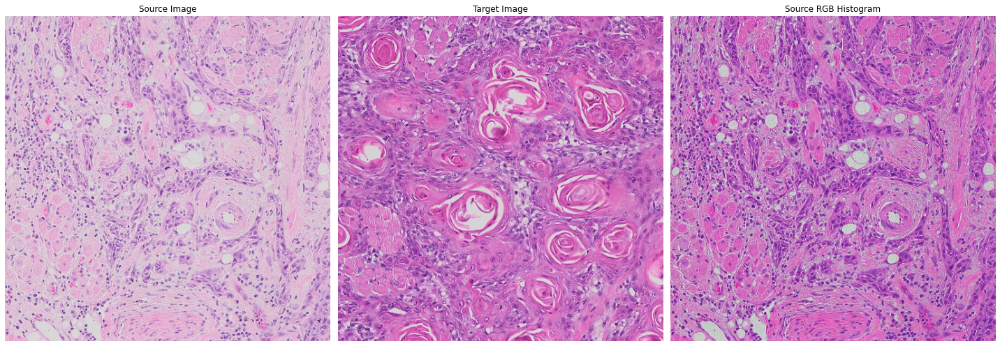

In [8]:
viz.plot_image_stack(image_stack[top:top+height, left:left+width, :, :], titles=['Source Image', 'Target Image', 'Source RGB Histogram'])

This looks pretty good! A few notes:

- We don't expect this to work on every image
- We have to have a target image we're normalizing to
- This method assumes independence of color channels and knows nothing about stain concentrations
- Patches with a lot of background might struggle, so we'd have to index into the tissue area by creating a mask first

Let's try the Reinhard method next!

# Reinhard

In this method, we have a few steps:

- Convert the images from RGB to LAB color space
- Calculate the mean and standard deviation of the image channels
- The normalized image is the the ((source - mean_source) * (std_target / std_source)) + mean_target

Easy, right?

In [9]:
source_reinhard = stains.reinhard_matching(source_image, target_image)

In [10]:
image_stack = np.stack([source_image, target_image, source_reinhard], axis=-1)

## Visualization

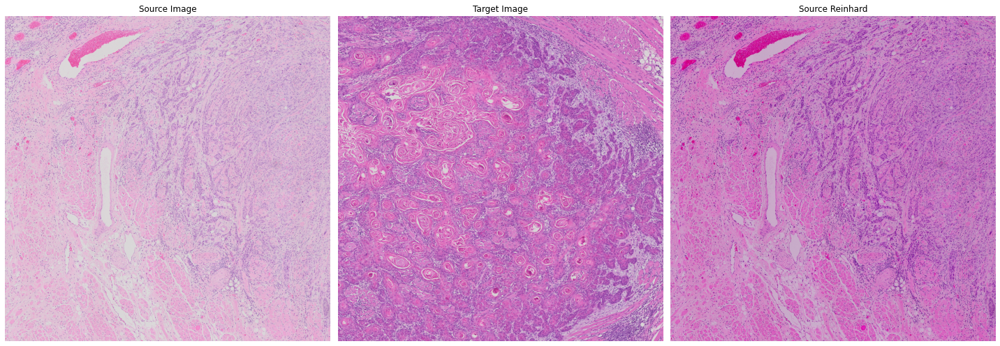

In [11]:
viz.plot_image_stack(image_stack, titles=['Source Image', 'Target Image', 'Source Reinhard'])

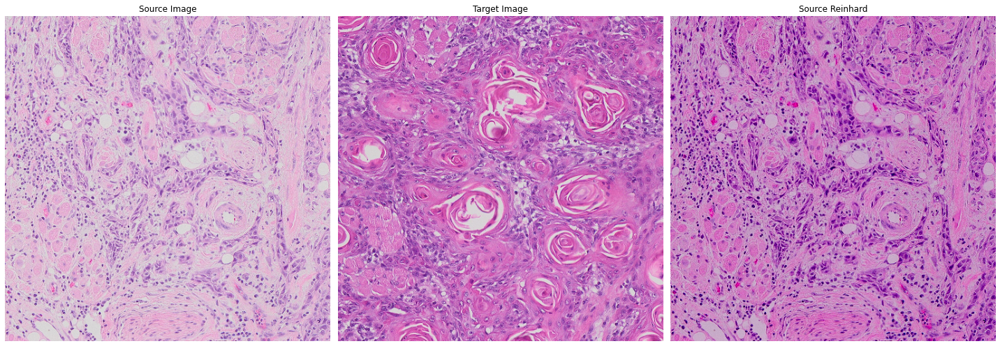

In [12]:
viz.plot_image_stack(image_stack[top:top+height, left:left+width, :, :], titles=['Source Image', 'Target Image', 'Source Reinhard'])

At high resolution, it looks like the RGB version contains more artifacts -- it looks like a more aggressive adjustment.

# Macenko Matching

In [13]:
source_macenko = stains.macenko_matching(source_image, target_image)

In [14]:
image_stack = np.stack([source_image, target_image, source_macenko], axis=-1)

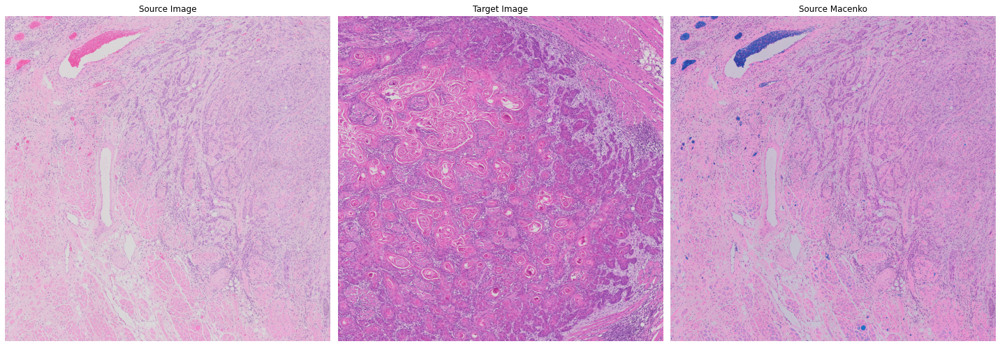

In [15]:
viz.plot_image_stack(image_stack, titles=['Source Image', 'Target Image', 'Source Macenko'])

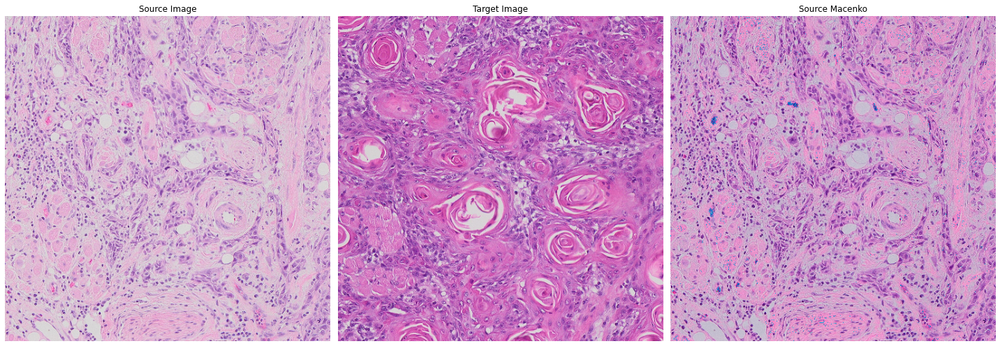

In [16]:
viz.plot_image_stack(image_stack[top:top+height, left:left+width, :, :], titles=['Source Image', 'Target Image', 'Source Macenko'])

Interestingly, in both the large ROI and the close-up, we see speckles of blue in the transformed image. These appear in regions with a high red component -- not sure why this is happening, maybe something is not being translated properly above.

# Compare

In [17]:
image_stack = np.stack([source_image, source_rgb, source_macenko, source_reinhard], axis=-1)

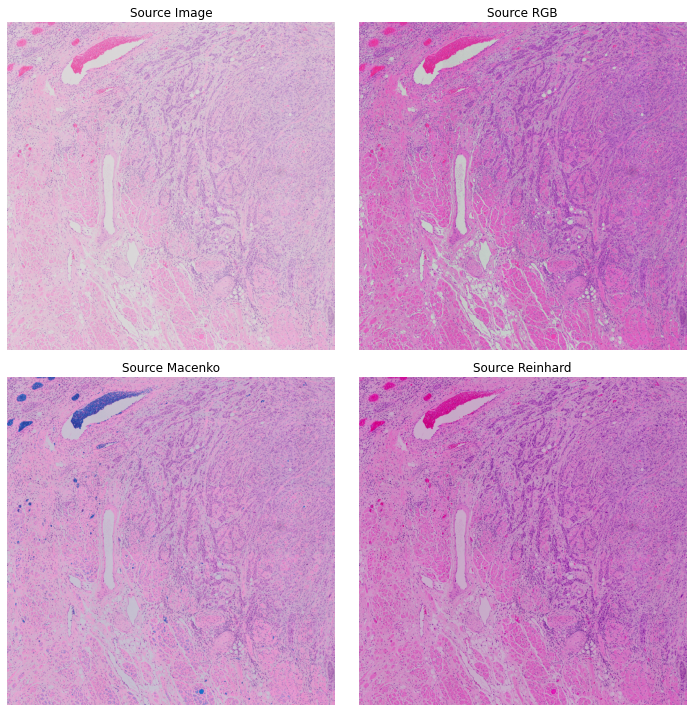

In [20]:
viz.plot_image_stack(image_stack, figsize=(10,10), ncols=2, titles=['Source Image', 'Source RGB', 'Source Macenko', 'Source Reinhard'])

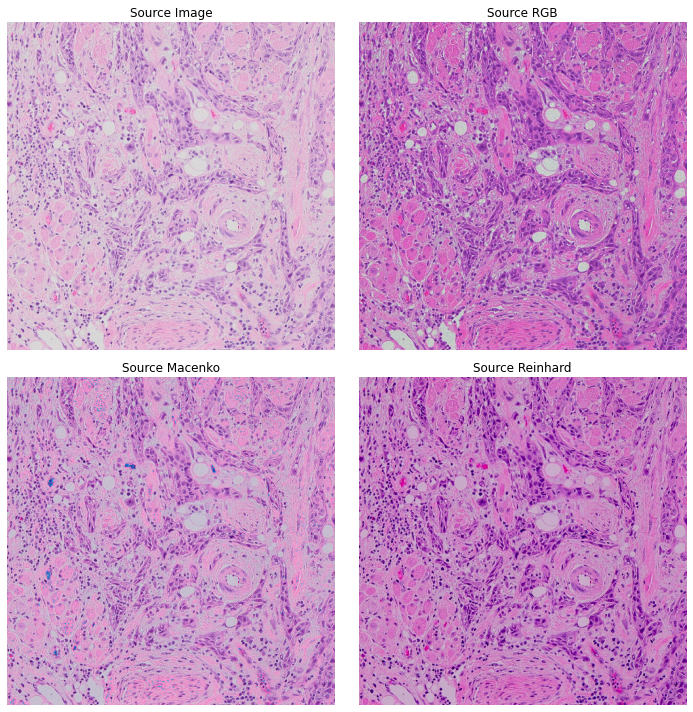

In [19]:
viz.plot_image_stack(image_stack[top:top+height, left:left+width, :, :], ncols=2, figsize=(10,10), titles=['Source Image', 'Source RGB', 'Source Macenko', 'Source Reinhard'])